# Imports.

In [174]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.io as pio

from scipy.optimize import fsolve

import os

from IPython.display import Image, display


from comp_econ import comp_econ as ce


# Plotly defaults and template.

In [175]:
pio.renderers.default = "plotly_mimetype+notebook"
pio.templates.default = "plotly_dark"

# My plotly template.
pio.templates["mvazquez"] = go.layout.Template(
    layout_annotations = [
        dict(
            name = "mvazquez watermark",
            text = "Created by MVazquez",
            opacity = 0.5,
            font = dict(color = "lightgrey", size = 20),
            xref = "paper",
            yref = "paper",
            x=1,
            y=0.01,
            showarrow = False            
            )        
        ])

# Define variables.

In [176]:
n_e = np.arange(0,25)
N_bar = len(n_e) - 1
A=2
alpha=0.33
epsilon=1.9
sigma=2
psi=1


# Define functions.

## Write the formula for equilibrium labor supply n_e, and place this into a function g(n_e, ...).

In [177]:
def g(
  _n_e: np.array,
  _N_bar: float,
  _A: float,
  _alpha: float,
  _epsilon: float,
  _sigma: float,
  _psi: float
  ):
  
  n_e_power = _n_e ** ((_alpha + _sigma) * (1 - _alpha))
  psi_div = _psi / ((1 - _alpha) * (_A ** (1 - _sigma)))
  n_e_ = _N_bar - ((psi_div * n_e_power) ** (1 / _epsilon))

  return n_e_

## Per the MATLAB and SciPy documentation, define F(x) = g(n_e, ...) - n_e.

In [178]:
def F(
    _n_e: np.array,
    _N_bar: float,
    _A: float,
    _alpha: float,
    _epsilon: float,
    _sigma: float,
    _psi: float
    ):

    # Pass the arguments to g(_n_e, ...) and subtract _n_e.
    return g(
        _n_e=_n_e,
        _N_bar=_N_bar,
        _A=_A,
        _alpha=_alpha,
        _epsilon=_epsilon,
        _sigma=_sigma,
        _psi=_psi
        ) - _n_e


## Define h(psi) = n_e.

In [179]:
# Here the hours are given and we want to find psi.
def h(
    _psi: float,
    _hours: float,
    _N_bar: float,
    _A: float,
    _alpha: float,
    _epsilon: float,
    _sigma: float,
    ):

    return g(
        _n_e=_hours,
        _N_bar=_N_bar,
        _A=_A,
        _alpha=_alpha,
        _epsilon=_epsilon,
        _sigma=_sigma,
        _psi=_psi
        ) - _hours

# Problem 1: Handwritten math photo.

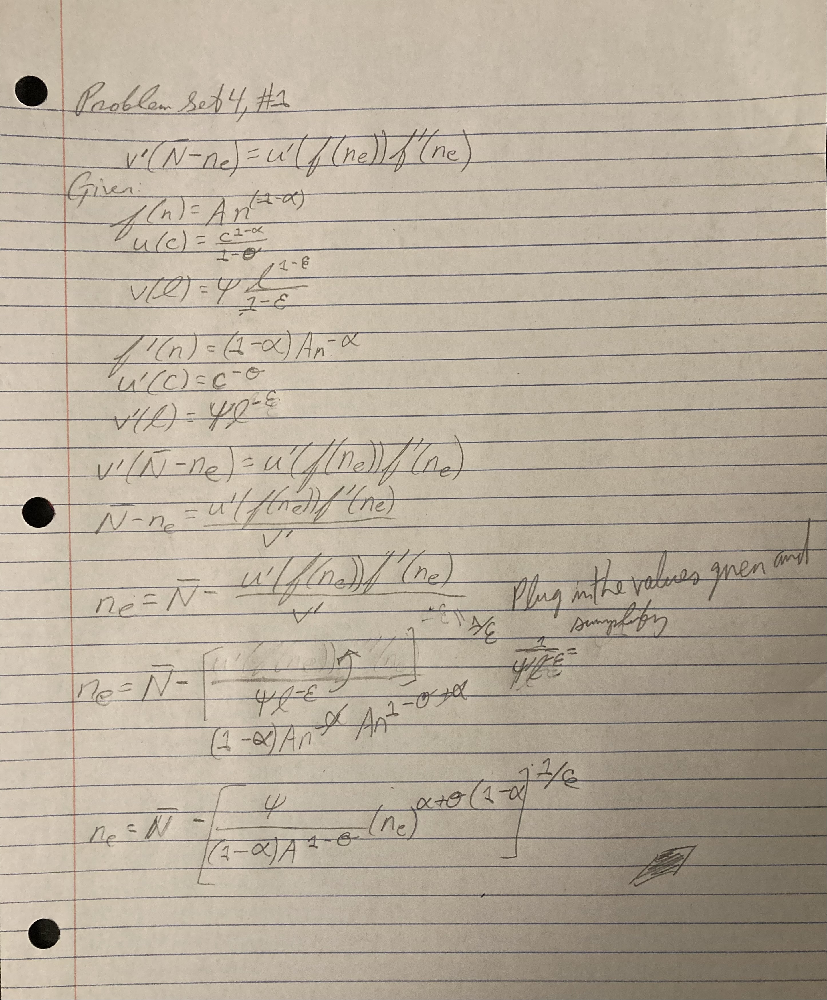

In [180]:
image_dir = os.getenv("ECON_560_IMAGE_DIR")
display(Image(rf'{image_dir}\\econ_560_ps4_1.jpg'))

# Problem 2.

## Model 24 hours.

In [181]:
# The problem tells us to use N_bar = 24 because there are 24 hours in a day.
# 0 to 24 hours can be worked in 1 day, so 0 to 24 should appear on the x axis.
# arr_hours = np.arange(0, 25)

g_n_e = g(
    _n_e=n_e,
    _N_bar=N_bar,
    _A=A,
    _alpha=alpha,
    _epsilon=epsilon,
    _sigma=sigma,
    _psi=psi
    )


## Plot equilibrium labor supply n_e.

In [182]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = n_e,
    y = g_n_e,
    mode='lines',
    name='g(n_e, ...)'
))

fig.add_trace(go.Scatter(
    # x=np.arange(0, N_bar),
    # y=np.arange(0, N_bar),
    x=n_e,
    y=n_e,
    mode='lines',
    name='45 degree line'
))

fig.update_layout(
    title="Equilibrium Labor Supply, g(n_e, ...) vs n_e",
    title_x=0.5,
    title_font_size=20,
    xaxis_title='Hours in Day, n_e',
    yaxis_title='Leisure Hours in Day, g(n_e, ...)',
    template = 'plotly_dark+mvazquez'
    )

fig.update_xaxes(title_font={'size': 16})
fig.update_yaxes(title_font={'size': 16})

fig.show()

## The question asks if function iteration would be a recommended here. Could check if |g'(n_e)| < 1, but let's graph the function iteration instead.

In [183]:
# Put the 'iter_' prefix on variable names here to avoid overwriting the n_e and g_n_e variables above.
iter_n_e_guess = 10
iter_g_n_e_list = []
# Pick some number larger than N_bar.
num_iterations = N_bar*5
print(f"Performing function iteration {num_iterations} times.")
for num in range(num_iterations):
    iter_n_e_guess = g(
        _n_e=iter_n_e_guess,
        _N_bar=N_bar,
        _A=A,
        _alpha=alpha,
        _epsilon=epsilon,
        _sigma=sigma,
        _psi=psi
        )
    iter_g_n_e_list.append(iter_n_e_guess)

fig.add_trace(go.Scatter(
    x=iter_g_n_e_list,
    y=iter_g_n_e_list,
    name='function iteration',
    mode='markers',
    marker={
        'size': 9,
        'color': 'green'
    }
))


fig.update_layout(
    title=f"Equilibrium Labor Supply, g(n_e, ...) vs n_e, Zoomed on Function Iteration {num_iterations} Times",
    title_x=0.7,
    title_font_size=20,
    xaxis_range=[11.122, 11.13],
    yaxis_range=[11.08, 11.16]
    )

fig.show()

Performing function iteration 120 times.


## In the zoomed graph with function iteration, we can see the points are quite close to the intersection of the 2 lines. Notice the x axis values of the zoomed graph, 11.122 to 11.13, and the y axis values 11.08 to 11.16. Thus we can say that function iteration would give a good estimated solution to the equilibrium point.

# Problem 3.

In [184]:
# Per the slides, bisect is a function available in the CompEcon toolbox. Therefore its fine to simply import a Python version of this and
# calculate the equilibrium via bisection method here.
%timeit
n_e_equil_bisect, num_iter_bisect = ce.bisect(
    f=F,
    a=0,
    b=24, 
    tol=1e-6, 
    max_iter=100,
    args=(N_bar, A, alpha, epsilon, sigma, psi)
)
print(f"Equilibrium labor supply is {np.round(n_e_equil_bisect, 4)}")
print(f"The bisection method converged in {num_iter_bisect} iterations.")

Equilibrium labor supply is 11.1265
The bisection method converged in 21 iterations.


# Problem 4.

In [185]:
%timeit
# full_output = True will give the number of iterations, per the documentation.
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.fsolve.html
n_e_equil_fsolve_full_output = fsolve(
    F,
    x0=10,
    args=(N_bar, A, alpha, epsilon, sigma, psi),
    full_output=True
    )
print(n_e_equil_fsolve_full_output)
n_e_equil_fsolve = np.round(n_e_equil_fsolve_full_output[0][0], 4)
print(f"Equilibrium labor supply is {n_e_equil_fsolve}.")
num_iter_fsolve = n_e_equil_fsolve_full_output[1]['nfev']
print(f"fsolve converged in {num_iter_fsolve} iterations.")

(array([11.12648441]), {'nfev': 8, 'fjac': array([[-1.]]), 'r': array([1.95064071]), 'qtf': array([-9.91059679e-10]), 'fvec': array([0.])}, 1, 'The solution converged.')
Equilibrium labor supply is 11.1265.
fsolve converged in 8 iterations.


# We expect the bisection method and fsolve to give nearly equal solutions. Let's check this.

In [186]:
assert np.isclose(n_e_equil_bisect, n_e_equil_fsolve), "The solution obtained via bisection method differs from the solution obtained via fsolve."

# Problem 5.

## Comparing the number of iterations required to find the solution, we can see that fsolve was faster.

In [187]:
print(f"fsolve converged in {num_iter_bisect - num_iter_fsolve} fewer iterations than the bisection method.")

fsolve converged in 13 fewer iterations than the bisection method.


# Problem 6.

## Lesiure hours given the initial values of this problem, ie the variables defined at the top of the notebook.

In [188]:
lesiure_hours_initial = np.round(24 - n_e_equil_fsolve, 4)
print(f"Given the initial values, {lesiure_hours_initial} hours are devoted to leisure and {n_e_equil_fsolve} hours are devoted to work.")

Given the initial values, 12.8735 hours are devoted to leisure and 11.1265 hours are devoted to work.


## Use fsolve, adjusting psi from 1 to 3.

In [189]:
# Recalculate using fsolve.
psi_adj = 3
# Copy and paste from Problem 4, just rename variables.
n_e_equil_fsolve_full_output_adj = fsolve(
    F,
    x0=10,
    args=(N_bar, A, alpha, epsilon, sigma, psi_adj),
    full_output=True
    )
print(n_e_equil_fsolve_full_output_adj)
n_e_equil_fsolve_adj = np.round(n_e_equil_fsolve_full_output_adj[0][0], 4)
print(f"Equilibrium labor supply adjusted, psi changed from 1 to 3, is {n_e_equil_fsolve_adj}.")
num_iter_fsolve_adj = n_e_equil_fsolve_full_output_adj[1]['nfev']
print(f"fsolve converged in {num_iter_fsolve_adj} iterations.")

(array([7.46503334]), {'nfev': 9, 'fjac': array([[-1.]]), 'r': array([2.8199049]), 'qtf': array([-3.48698848e-12]), 'fvec': array([1.77635684e-15])}, 1, 'The solution converged.')
Equilibrium labor supply adjusted, psi changed from 1 to 3, is 7.465.
fsolve converged in 9 iterations.


In [190]:
lesiure_hours_adj = np.round(24 - n_e_equil_fsolve_adj, 4)
print(f"Given the adjusted value psi = 3, {lesiure_hours_adj} hours are devoted to leisure and {n_e_equil_fsolve_adj} hours are devoted to work.")

Given the adjusted value psi = 3, 16.535 hours are devoted to leisure and 7.465 hours are devoted to work.


In [191]:
leisure_change_pct = np.round(
    ((lesiure_hours_adj - lesiure_hours_initial) / lesiure_hours_initial) * 100,
    4)
work_change_pct = np.round(
    ((n_e_equil_fsolve_adj - n_e_equil_fsolve) / n_e_equil_fsolve) * 100,
    4)

In [192]:
print(f"Leisure hours have changed by {leisure_change_pct} percent, and work hours have changed by {work_change_pct} percent.")

Leisure hours have changed by 28.4421 percent, and work hours have changed by -32.9079 percent.


## The economic interpretation here is that psi in this model is a parameter that acts as a factor of leisure hours. We see that increasing psi from 1 to 3 increases leisure hours, which is equivalent to decreasing work hours.

# Problem 7.

In [193]:
# The initial value of psi is 1, so let's start with guess x0=1.
psi_fsolve_full_output = fsolve(
    h,
    x0=1,
    args=(8, N_bar, A, alpha, epsilon, sigma),
    full_output=True
)
print(psi_fsolve_full_output)
psi_fsolve = np.round(psi_fsolve_full_output[0][0], 4)
print(f"Given that an individual works 8 hours, ie equilibrium labor supply is 8 hours, psi = {psi_fsolve}.")

(array([2.5296416]), {'nfev': 10, 'fjac': array([[-1.]]), 'r': array([3.32895441]), 'qtf': array([-6.99812119e-09]), 'fvec': array([7.10542736e-15])}, 1, 'The solution converged.')
Given that an individual works 8 hours, ie equilibrium labor supply is 8 hours, psi = 2.5296.
